<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Import-dataset" data-toc-modified-id="Import-dataset-1">Import dataset</a></span></li><li><span><a href="#Datacleaning" data-toc-modified-id="Datacleaning-2">Datacleaning</a></span><ul class="toc-item"><li><span><a href="#Premier-cleaning" data-toc-modified-id="Premier-cleaning-2.1">Premier cleaning</a></span></li><li><span><a href="#Suppression-des-lignes-NaN/Null-pour-‘tags’-et-‘title’" data-toc-modified-id="Suppression-des-lignes-NaN/Null-pour-‘tags’-et-‘title’-2.2">Suppression des lignes NaN/Null pour ‘tags’ et ‘title’</a></span></li><li><span><a href="#Suppression-des-années-aberrantes-(celles-avant-la-création-de-Flickr-2004)" data-toc-modified-id="Suppression-des-années-aberrantes-(celles-avant-la-création-de-Flickr-2004)-2.3">Suppression des années aberrantes (celles avant la création de Flickr 2004)</a></span></li><li><span><a href="#Suppression-des-géolocalisation-hors-Lyon" data-toc-modified-id="Suppression-des-géolocalisation-hors-Lyon-2.4">Suppression des géolocalisation hors Lyon</a></span></li><li><span><a href="#Convertir-date_taken_upload-/-Taken-en-Datetime" data-toc-modified-id="Convertir-date_taken_upload-/-Taken-en-Datetime-2.5">Convertir date_taken_upload / Taken en Datetime</a></span></li><li><span><a href="#Export" data-toc-modified-id="Export-2.6">Export</a></span></li></ul></li><li><span><a href="#Clustering" data-toc-modified-id="Clustering-3">Clustering</a></span></li><li><span><a href="#Visualisation" data-toc-modified-id="Visualisation-4">Visualisation</a></span><ul class="toc-item"><li><span><a href="#Evolution-2014-/-2015" data-toc-modified-id="Evolution-2014-/-2015-4.1">Evolution 2014 / 2015</a></span></li><li><span><a href="#Evolution-par-saison-(printemps/été-vs-automne/hiver)" data-toc-modified-id="Evolution-par-saison-(printemps/été-vs-automne/hiver)-4.2">Evolution par saison (printemps/été vs automne/hiver)</a></span></li><li><span><a href="#Evolution-par-heure-(matin-/-après-midi-/-soir)" data-toc-modified-id="Evolution-par-heure-(matin-/-après-midi-/-soir)-4.3">Evolution par heure (matin / après-midi / soir)</a></span></li></ul></li><li><span><a href="#NLP" data-toc-modified-id="NLP-5">NLP</a></span><ul class="toc-item"><li><span><a href="#Wordcloud-tags" data-toc-modified-id="Wordcloud-tags-5.1">Wordcloud tags</a></span></li><li><span><a href="#Wordcloud-title" data-toc-modified-id="Wordcloud-title-5.2">Wordcloud title</a></span></li></ul></li></ul></div>

# Import dataset

In [50]:
import pandas as pd
import numpy as np

# Visualisation
import seaborn as sns
import plotly.express as px
token = open(".mapbox_token").read()
import matplotlib.pyplot as plt

#KMEANS 
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, silhouette_samples

# NLP 
import requests
from bs4 import BeautifulSoup
import spacy
from spacy.lang.fr.examples import sentences
from wordcloud import WordCloud

In [40]:
# Suppression de la Ligne 1554 dans le csv du dataset qui empêche l’import

df_raw = pd.read_csv("flickr_data.csv")
df = df_raw

C:\Users\Utilisateur\anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3172: DtypeWarning:

Columns (6,7,8) have mixed types.Specify dtype option on import or set low_memory=False.



# Datacleaning

## Premier cleaning

In [41]:
df = df.rename(columns=lambda x: x.strip()) # Enlever les espaces blancs en début des titres des features (colonnes)
df = df.drop(['Unnamed: 16', 'Unnamed: 17', 'Unnamed: 18'], axis=1)
df = df.drop_duplicates() # Suppression des lignes duplicates (en doublon)
df = df.drop_duplicates(subset='id', keep='first') # Suppression des 'id' duplicates
df = df.drop(['id', 'user'], axis=1) # Suppression des features ‘id’ et ‘user’ pour l’anonymisation
df = df.drop(['date_taken_minute', 'date_upload_minute'], axis=1) # Suppression des features 'date_taken_minute' et  'date_upload_minute'

df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 15173 entries, 0 to 83769
Data columns (total 12 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   lat                15173 non-null  float64
 1   long               15173 non-null  float64
 2   tags               11187 non-null  object 
 3   title              13557 non-null  object 
 4   date_taken_hour    15173 non-null  object 
 5   date_taken_day     15173 non-null  object 
 6   date_taken_month   15173 non-null  int64  
 7   date_taken_year    15173 non-null  int64  
 8   date_upload_hour   15173 non-null  int64  
 9   date_upload_day    15173 non-null  int64  
 10  date_upload_month  15173 non-null  int64  
 11  date_upload_year   15173 non-null  int64  
dtypes: float64(2), int64(6), object(4)
memory usage: 1.5+ MB


## Suppression des lignes NaN/Null pour ‘tags’ et ‘title’

In [11]:
# Il n'y a pas de lignes ayant tags et title en Null
df = df[(df['tags'] != 'Null') & (df['title'] != 'Null')] 
df.shape

(15173, 12)

## Suppression des années aberrantes (celles avant la création de Flickr 2004)

In [7]:
# df['date_taken_year'].value_counts()
# df['date_upload_year'].value_counts()

In [42]:
df = df[df['date_upload_year']>2004] # Pour upload
df = df[df['date_taken_year']>2004] # Pour taken
df.shape

(15059, 12)

## Suppression des géolocalisation hors Lyon

In [6]:
# Df de base
fig = px.scatter_mapbox(df, lat='lat',lon='long', hover_name="title", color_discrete_sequence=["fuchsia"])
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

In [43]:
df = df[(df['long']>4.78) & (df['long']<4.9) & (df['lat']>45.7) & (df['lat']<45.82)]

# Df de après suppression outliers
fig = px.scatter_mapbox(df, lat='lat',lon='long', hover_name="title", color_discrete_sequence=["fuchsia"])
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

## Convertir date_taken_upload / Taken en Datetime

In [44]:
taken = {'day' : df['date_taken_day'],
           'month' : df['date_taken_month'],
           'year' : df['date_taken_year'],
           'hour' : df['date_taken_hour'],
          }

upload = {'day' : df['date_upload_day'],
           'month' : df['date_upload_month'],
           'year' : df['date_upload_year'],
           'hour' : df['date_upload_hour'],          
           }

df['date_taken'] = pd.to_datetime(taken)
df['date_upload'] = pd.to_datetime(upload)

df_visu_evo = df # df à utiliser pour la visualisation
# Suppression des features
df = df.drop(['date_taken_hour', 'date_taken_day', 'date_taken_month', 'date_taken_year', 
              'date_upload_hour', 'date_upload_day', 'date_upload_month', 'date_upload_year'], axis=1)


## Export

In [13]:
df.to_csv('df_clean.csv', sep='|', index=False)

# Clustering

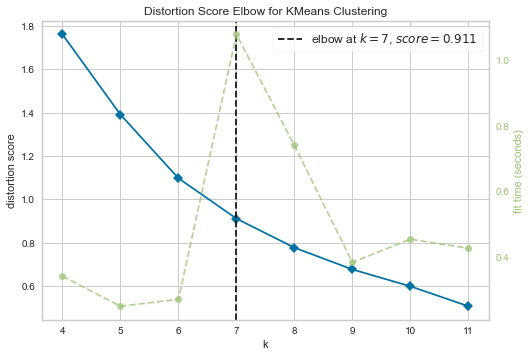

In [45]:
df_cluster = df.drop(['date_taken', 'date_upload', 'title', 'tags'], axis=1)

# Instantiate the clustering model and visualizer
model = KMeans()
visualizer = KElbowVisualizer(model, k=(4,12))

# Fit the data to the visualizer
visualizer.fit(df_cluster)        
visualizer.show()

#K-means
kmeans = KMeans(n_clusters=7)
kmeans.fit(df_cluster)

# kmeans.labels_
# kmeans.cluster_centers_

df['cluster'] = kmeans.labels_


# Visualisation sur la map
fig = px.scatter_mapbox(df, lat='lat',lon='long', hover_name="title", color="cluster", color_discrete_sequence=["fuchsia"])
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

In [9]:
df.to_csv('df_cluster.csv', sep='|', index=False)

# Visualisation

## Evolution 2014 / 2015

In [30]:
df_visu_evo['date_upload_year'] = df_visu_evo['date_upload_year'].astype(str)
fig = px.scatter_mapbox(df_visu_evo, lat='lat',lon='long', hover_name="title", color='date_upload_year')
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

## Evolution par saison (printemps/été vs automne/hiver)

In [71]:
df_visu_evo2 = df_visu_evo

df_visu_evo2['date_upload_month'] = df_visu_evo2['date_upload_month'].astype(int)
df_visu_evo2['Saison'] = pd.cut(x=df_visu_evo2['date_upload_month'], bins=[0, 3, 9, 12])
df_visu_evo2['Saison'] = df_visu_evo2['Saison'].astype(str)
df_visu_evo2['Saison'] = df_visu_evo2['Saison'].replace({"(9, 12]": "Automne/hiver", "(0, 3]": "Automne/hiver", "(3, 9]": "Printemps/été"})
# df_visu_evo2['Saison'].value_counts()


fig = px.scatter_mapbox(df_visu_evo2, lat='lat',lon='long', hover_name="title", color='Saison')
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

## Evolution par heure (matin / après-midi / soir)

In [79]:
df_visu_evo3 = df_visu_evo

df_visu_evo3['date_upload_hour'] = df_visu_evo3['date_upload_hour'].astype(int)
df_visu_evo3['Journee'] = pd.cut(x=df_visu_evo3['date_upload_hour'], bins=[-1, 6, 12, 18, 24])
df_visu_evo3['Journee'] = df_visu_evo3['Journee'].astype(str)
df_visu_evo3['Journee'] = df_visu_evo3['Journee'].replace({"(18, 24]": "Soir", "(6, 12]": "Matin", "(12, 18]": "Après-midi", "(-1, 6]": "Soir"})
df_visu_evo3['Journee'].value_counts()


fig = px.scatter_mapbox(df_visu_evo3, lat='lat',lon='long', hover_name="title", color='Journee')
fig.update_layout(title = 'Ville de Lyon', title_x=0.5)
fig.update_layout(mapbox_style="dark", mapbox_accesstoken=token)
fig.show()

In [73]:
df_visu_evo['date_upload_hour'].value_counts()

11    1156
19    1020
22     998
21     923
20     808
23     702
17     636
16     536
18     530
12     492
8      352
14     340
15     320
10     318
13     283
9      266
0      228
6      211
1      143
2      139
5      111
4      100
7       98
3       32
Name: date_upload_hour, dtype: int64

# NLP

In [48]:
data = df
tags = data['tags']

## Wordcloud tags

In [51]:
nlp = spacy.load("fr_core_news_sm")

In [52]:
nlp.max_length = 1500000

In [53]:
tags= pd.DataFrame(tags, columns=['tags'])

In [54]:
tags = tags[tags.tags != 'nan']

In [55]:
tags['tags'] = tags['tags'].astype('str')

In [56]:
hashtags = tags['tags'].values.tolist()

In [57]:
for i in range(len(hashtags)):
    hashtags[i] = hashtags[i].strip()

In [58]:
hash_tags = ' '.join(hashtags)

In [59]:
doc = nlp(hash_tags)

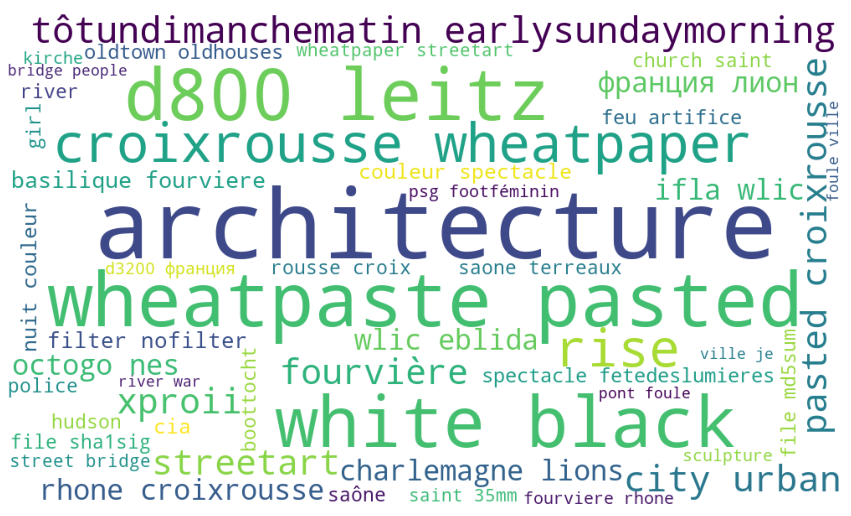

In [60]:
exclure_mots = ['nan','lyon','villeurbanne','insa', 'cross','square','instagram','uploadedby', 'instagramapp','jacquesmeynierdemalviala','charlie','terrorism','uploaded','flickrmobile','flickriosapp','by','summicron','f2','summirconr35mmf2','iphoneography', 'squareformat', 'summicronr','summicronr35mmf2','foursquare','l35d800','nikon','leitax','france','europe', 'frankreich','rhônealpes','rhône','francja','lyo15','leica','venue','blackandwhite','bw','noiretblanc','pasteup','collage','collage','paper']

def make_word_cloud(doc, stopwords = None) -> None:
    wordcloud = WordCloud(background_color = 'white', max_words = 50, stopwords=exclure_mots, width=1000, height=600).generate(doc.text)
    plt.figure(figsize=(15,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
make_word_cloud(doc)

## Wordcloud title

In [61]:
title = data['title']
title= pd.DataFrame(title, columns=['title'])

In [62]:
title = title[title.title != 'nan']

In [63]:
title['title'] = title['title'].astype('str')

In [64]:
title = title['title'].values.tolist()

In [65]:
for i in range(len(title)):
    title[i] = title[i].strip()

In [66]:
title = ' '.join(title)

In [67]:
doc_title = nlp(title)

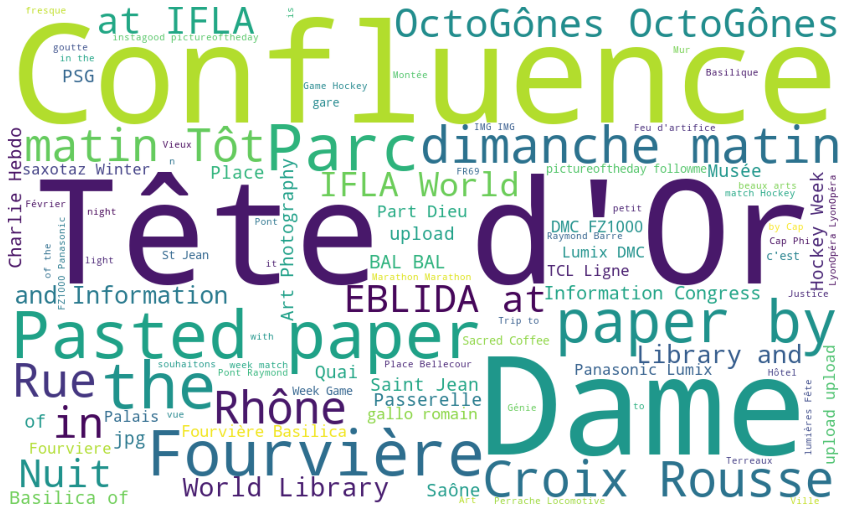

In [68]:
exclure_titre = ['a','abord','afin','ah','nan','Lyon','France','lyon','france',
 'ai',
 'aie',
 'ainsi',
 'ait',
 'allaient',
 'allons',
 'alors',
 'anterieur',
 'anterieure',
 'anterieures',
 'antérieur',
 'antérieure',
 'antérieures',
 'apres',
 'après',
 'as',
 'assez',
 'attendu',
 'au',
 'aupres',
 'auquel',
 'aura',
 'auraient',
 'aurait',
 'auront',
 'aussi',
 'autre',
 'autrement',
 'autres',
 'autrui',
 'aux',
 'auxquelles',
 'auxquels',
 'avaient',
 'avais',
 'avait',
 'avant',
 'avec',
 'avoir',
 'avons',
 'ayant',
 'bas',
 'basee',
 'bat',
 "c'",
 'car',
 'ce',
 'ceci',
 'cela',
 'celle',
 'celle-ci',
 'celle-la',
 'celle-là',
 'celles',
 'celles-ci',
 'celles-la',
 'celles-là',
 'celui',
 'celui-ci',
 'celui-la',
 'celui-là',
 'cent',
 'cependant',
 'certain',
 'certaine',
 'certaines',
 'certains',
 'certes',
 'ces',
 'cet',
 'cette',
 'ceux',
 'ceux-ci',
 'ceux-là',
 'chacun',
 'chacune',
 'chaque',
 'chez',
 'ci',
 'cinq',
 'cinquantaine',
 'cinquante',
 'cinquantième',
 'cinquième',
 'combien',
 'comme',
 'comment',
 'compris',
 'concernant',
 'c’',
 "d'",
 'da',
 'dans',
 'de',
 'debout',
 'dedans',
 'dehors',
 'deja',
 'dejà',
 'delà',
 'depuis',
 'derriere',
 'derrière',
 'des',
 'desormais',
 'desquelles',
 'desquels',
 'dessous',
 'dessus',
 'deux',
 'deuxième',
 'deuxièmement',
 'devant',
 'devers',
 'devra',
 'different',
 'differente',
 'differentes',
 'differents',
 'différent',
 'différente',
 'différentes',
 'différents',
 'dire',
 'directe',
 'directement',
 'dit',
 'dite',
 'dits',
 'divers',
 'diverse',
 'diverses',
 'dix',
 'dix-huit',
 'dix-neuf',
 'dix-sept',
 'dixième',
 'doit',
 'doivent',
 'donc',
 'dont',
 'douze',
 'douzième',
 'du',
 'duquel',
 'durant',
 'dès',
 'déja',
 'déjà',
 'désormais',
 'd’',
 'effet',
 'egalement',
 'eh',
 'elle',
 'elle-meme',
 'elle-même',
 'elles',
 'elles-memes',
 'elles-mêmes',
 'en',
 'encore',
 'enfin',
 'entre',
 'envers',
 'environ',
 'es',
 'est',
 'et',
 'etaient',
 'etais',
 'etait',
 'etant',
 'etc',
 'etre',
 'eu',
 'eux',
 'eux-mêmes',
 'exactement',
 'excepté',
 'facon',
 'fais',
 'faisaient',
 'faisant',
 'fait',
 'façon',
 'feront',
 'font',
 'gens',
 'ha',
 'hem',
 'hep',
 'hi',
 'ho',
 'hormis',
 'hors',
 'hou',
 'houp',
 'hue',
 'hui',
 'huit',
 'huitième',
 'hé',
 'i',
 'il',
 'ils',
 'importe',
 "j'",
 'je',
 'jusqu',
 'jusque',
 'juste',
 'j’',
 "l'",
 'la',
 'laisser',
 'laquelle',
 'le',
 'lequel',
 'les',
 'lesquelles',
 'lesquels',
 'leur',
 'leurs',
 'longtemps',
 'lors',
 'lorsque',
 'lui',
 'lui-meme',
 'lui-même',
 'là',
 'lès',
 'l’',
 "m'",
 'ma',
 'maint',
 'maintenant',
 'mais',
 'malgre',
 'malgré',
 'me',
 'meme',
 'memes',
 'merci',
 'mes',
 'mien',
 'mienne',
 'miennes',
 'miens',
 'mille',
 'moi',
 'moi-meme',
 'moi-même',
 'moindres',
 'moins',
 'mon',
 'même',
 'mêmes',
 'm’',
 "n'",
 'na',
 'ne',
 'neanmoins',
 'neuvième',
 'ni',
 'nombreuses',
 'nombreux',
 'nos',
 'notamment',
 'notre',
 'nous',
 'nous-mêmes',
 'nouveau',
 'nul',
 'néanmoins',
 'nôtre',
 'nôtres',
 'n’',
 'o',
 'on',
 'ont',
 'onze',
 'onzième',
 'or',
 'ou',
 'ouias',
 'ouste',
 'outre',
 'ouvert',
 'ouverte',
 'ouverts',
 'où',
 'par',
 'parce',
 'parfois',
 'parle',
 'parlent',
 'parler',
 'parmi',
 'partant',
 'pas',
 'pendant',
 'pense',
 'permet',
 'personne',
 'peu',
 'peut',
 'peuvent',
 'peux',
 'plus',
 'plusieurs',
 'plutot',
 'plutôt',
 'possible',
 'possibles',
 'pour',
 'pourquoi',
 'pourrais',
 'pourrait',
 'pouvait',
 'prealable',
 'precisement',
 'premier',
 'première',
 'premièrement',
 'pres',
 'procedant',
 'proche',
 'près',
 'préalable',
 'précisement',
 'pu',
 'puis',
 'puisque',
 "qu'",
 'quand',
 'quant',
 'quant-à-soi',
 'quarante',
 'quatorze',
 'quatre',
 'quatre-vingt',
 'quatrième',
 'quatrièmement',
 'que',
 'quel',
 'quelconque',
 'quelle',
 'quelles',
 "quelqu'un",
 'quelque',
 'quelques',
 'quels',
 'qui',
 'quiconque',
 'quinze',
 'quoi',
 'quoique',
 'qu’',
 'relative',
 'relativement',
 'rend',
 'rendre',
 'restant',
 'reste',
 'restent',
 'retour',
 'revoici',
 'revoila',
 'revoilà',
 "s'",
 'sa',
 'sait',
 'sans',
 'sauf',
 'se',
 'seize',
 'selon',
 'semblable',
 'semblaient',
 'semble',
 'semblent',
 'sent',
 'sept',
 'septième',
 'sera',
 'seraient',
 'serait',
 'seront',
 'ses',
 'seul',
 'seule',
 'seulement',
 'seules',
 'seuls',
 'si',
 'sien',
 'sienne',
 'siennes',
 'siens',
 'sinon',
 'six',
 'sixième',
 'soi',
 'soi-meme',
 'soi-même',
 'soit',
 'soixante',
 'son',
 'sont',
 'sous',
 'souvent',
 'specifique',
 'specifiques',
 'spécifique',
 'spécifiques',
 'stop',
 'suffisant',
 'suffisante',
 'suffit',
 'suis',
 'suit',
 'suivant',
 'suivante',
 'suivantes',
 'suivants',
 'suivre',
 'sur',
 'surtout',
 's’',
 "t'",
 'ta',
 'tant',
 'te',
 'tel',
 'telle',
 'tellement',
 'telles',
 'tels',
 'tenant',
 'tend',
 'tenir',
 'tente',
 'tes',
 'tien',
 'tienne',
 'tiennes',
 'tiens',
 'toi',
 'toi-meme',
 'toi-même',
 'ton',
 'touchant',
 'toujours',
 'tous',
 'tout',
 'toute',
 'toutes',
 'treize',
 'trente',
 'tres',
 'trois',
 'troisième',
 'troisièmement',
 'très',
 'tu',
 'té',
 't’',
 'un',
 'une',
 'unes',
 'uns',
 'va',
 'vais',
 'vas',
 'vers',
 'via',
 'vingt',
 'voici',
 'voila',
 'voilà',
 'vont',
 'vos',
 'votre',
 'votres',
 'vous',
 'vous-mêmes',
 'vu',
 'vé',
 'vôtre',
 'vôtres',
 'y',
 'à',
 'â',
 'ça',
 'ès',
 'également',
 'étaient',
 'étais',
 'était',
 'étant',
 'être',
 'ô']


def make_word_cloud(doc_title, stopwords = None) -> None:
    wordcloud = WordCloud(background_color = 'white', max_words = 100, stopwords=exclure_titre, width=1000, height=600).generate(doc_title.text)
    plt.figure(figsize=(15,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()
make_word_cloud(doc_title)